<a href="https://colab.research.google.com/github/samarkinav/ds_project/blob/main/DSC13_team_oaop_vvb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Импорт библиотек


In [ ]:
!pip install pymorphy2
!pip install natasha
!pip install nltk

In [ ]:
import nltk
import pymorphy2
import pandas as pd
import re
import numpy as np
import collections
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import string
from nltk.stem.snowball import SnowballStemmer
from natasha import (
    Segmenter,
    MorphVocab,
    NewsEmbedding,
    NewsMorphTagger,
    DatesExtractor, 
    Doc)
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamulticore import LdaMulticore
import pyLDAvis.gensim_models
import gensim
from gensim.models.coherencemodel import CoherenceModel
import random
import networkx as nx

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_lda.py:29: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  EPS = np.finfo(np.float).eps


# Скачиваем данные


In [ ]:
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1d5NQuYPlkvj2IuHMJ2DFvQ_nXX4f70ZC' -O Mosru_dump_all_pages.txt

--2021-05-07 08:37:20--  https://docs.google.com/uc?export=download&id=1d5NQuYPlkvj2IuHMJ2DFvQ_nXX4f70ZC
Resolving docs.google.com (docs.google.com)... 64.233.189.100, 64.233.189.139, 64.233.189.138, ...
Connecting to docs.google.com (docs.google.com)|64.233.189.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-10-ak-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/j51kjhcmqh8f38sp8bsmgibf8gslsd2u/1620376575000/03619448018617981983/*/1d5NQuYPlkvj2IuHMJ2DFvQ_nXX4f70ZC?e=download [following]
--2021-05-07 08:37:22--  https://doc-10-ak-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/j51kjhcmqh8f38sp8bsmgibf8gslsd2u/1620376575000/03619448018617981983/*/1d5NQuYPlkvj2IuHMJ2DFvQ_nXX4f70ZC?e=download
Resolving doc-10-ak-docs.googleusercontent.com (doc-10-ak-docs.googleusercontent.com)... 74.125.23.132, 2404:6800:4008:c02::84
Connecting to doc-10-ak-docs.googleusercontent.com (doc-10-ak-do

In [ ]:
df = pd.read_csv('Mosru_dump_all_pages.txt', engine='python', sep="', '", names=['тема','текст','что-то','ответственный','дата'])
print(df.head())

                                                тема  ...                      дата
0  'Сообщение о проблеме «Несоблюдение требований...  ...   16 Ноября 2020 в 16:31'
1  'Сообщение о проблеме «Неубранная городская те...  ...      05 Мая 2020 в 15:45'
2  'Сообщение о проблеме «Неубранная городская те...  ...    01 Марта 2020 в 16:57'
3  'Сообщение о проблеме «Неубранная городская те...  ...   16 Января 2020 в 13:54'
4  'Сообщение о проблеме «Захламление территории»...  ...  24 Августа 2019 в 15:39'

[5 rows x 5 columns]


In [ ]:
del df['что-то']

Мы хотим вытащить из последнего столбца даты. Сделаем это с помощью библиотеки Natasha. 

In [ ]:
segmenter = Segmenter()
morph_vocab = MorphVocab()
emb = NewsEmbedding()
morph_tagger = NewsMorphTagger(emb)
dates_extractor = DatesExtractor(morph_vocab)

/usr/local/lib/python3.7/dist-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
/usr/local/lib/python3.7/dist-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
/usr/local/lib/python3.7/dist-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
/usr/local/lib/python3.7/dist-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.g

# Предобработка данных

Функция обработки дат:



In [ ]:
def preparing_dates(string):
    matches = dates_extractor(string)
    facts = [_.fact.as_json for _ in matches]

    for f in facts:
        date = (f"{f.get('day')}.{f.get('month')}.{f.get('year')}")
        year = (f"{f.get('year')}")
    return [date, year]

Обрабатывать адреса будем с помощью регулярных выражений. Используя их же, вычленим из первого столбца саму жалобу.

In [ ]:
address_list = []
appeal_list = []
year_list = []

for i in range(df.shape[0]):
    [df.iloc[i, 3], year] = preparing_dates(df.iloc[i, 3])
    year_list.append(year)

    address_list.append(re.search('по адресу (.*)', df.iloc[i, 0]).group(1))
    appeal_list.append(re.search('«(.*)»', df.iloc[i, 0], flags=re.IGNORECASE).group(1))

df['адрес'] = address_list
df['тема'] = appeal_list
df['год']= year_list

df['дата']=pd.to_datetime(df['дата'],dayfirst=True)
print(df.head(20))

                                                 тема  ...   год
0   Несоблюдение требований к размещению информаци...  ...  2020
1                     Неубранная городская территория  ...  2020
2                     Неубранная городская территория  ...  2020
3                     Неубранная городская территория  ...  2020
4                              Захламление территории  ...  2019
5                              Захламление территории  ...  2019
6   Несоблюдение требований к размещению информаци...  ...  2019
7   Несоблюдение требований к размещению информаци...  ...  2018
8   Несоблюдение требований к размещению информаци...  ...  2018
9                     Отсутствие информационного щита  ...  2017
10                             Захламление территории  ...  2017
11                             Захламление территории  ...  2017
12         Незаконная установка рекламной конструкции  ...  2017
13         Незаконная установка рекламной конструкции  ...  2017
14                       

In [ ]:
year_val=pd.DataFrame(df['год'].value_counts()).reset_index()
year_val.columns=['year','count']
year_val=year_val.sort_values(by='year',ascending=True).reset_index()
del year_val['index']

# Распределение обращений в динамике по годам

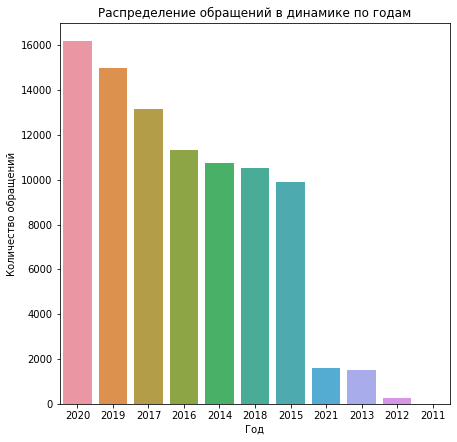

In [ ]:
plt.figure(figsize=(7,7))
data=df["год"].value_counts()
sns.barplot(x=data.index, y=data.values)

plt.title('Распределение обращений в динамике по годам')
plt.xlabel("Год")
plt.ylabel("Количество обращений")

plt.show()

# Распределение обращений в динамике по месяцам

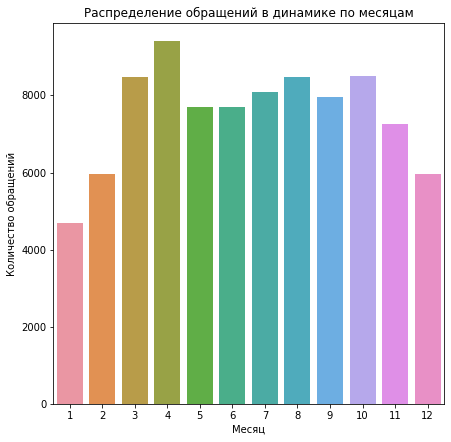

In [ ]:
plt.figure(figsize=(7,7))
df['месяц']=df['дата'].dt.month
data=df["месяц"].value_counts()
sns.barplot(x=data.index, y=data.values)

plt.title('Распределение обращений в динамике по месяцам')
plt.xlabel("Месяц")
plt.ylabel("Количество обращений")

plt.show()

# ТОП-20 тематик обращений

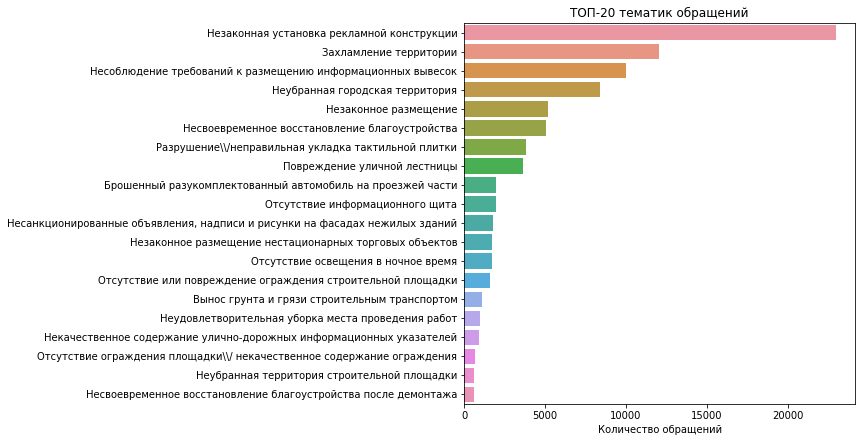

In [ ]:
plt.figure(figsize=(7,7))

def plot_counts(data, title):
  sns.barplot(x=data.values, y=data.index)
  plt.title(title)
  plt.xlabel("Количество обращений")

plot_counts(data=df["тема"].value_counts()[:20], title="ТОП-20 тематик обращений")

Мы хотим вытащить из 3 столбца название района, в котором зарегистрирована проблема. Для этого нам нужна функция приведения слова к нормальной форме:

In [ ]:
test_df = df

# Функция для приведения к нормальной форме слова

In [ ]:
def to_norm(x):
  morph = pymorphy2.MorphAnalyzer()
  p = morph.parse(x)[0]
  return p.normal_form

# Обработка районов из текста

In [ ]:
test_df['район']=None
test_df['район_2']=None
test_df['район_3']=None
test_df['район'] = test_df['ответственный'].str.extract(r'(?<=района )(.*)(?= города)')
test_df['район_2'] = test_df['ответственный'].str.extract(r'(?<=управы )(.*)(?= района)')
test_df['район_3'] = test_df['ответственный'].str.extract(r'(?<=управы района)(.*)')
test_df['район']=test_df['район'].astype(str)
test_df['район_2']=test_df['район_2'].astype(str)
test_df['район_3']=test_df['район_3'].astype(str)
test_df['район_4']=np.where(test_df['район'] == 'nan',test_df['район_2'],test_df['район'])
test_df['район_4']=np.where(test_df['район_4'] == 'nan',test_df['район_3'],test_df['район_4'])
test_df=test_df[['тема','текст','ответственный','дата','адрес','год','район_4']]
test_df.columns=['тема','текст','ответственный','дата','адрес','год','район']
pd.DataFrame(test_df.head(200))

,тема,текст,ответственный,дата,адрес,год,район
0,Несоблюдение требований к размещению информаци...,Выше второго этажа,начальник Объединения административно-техниче...,2020-11-16,Снежная улица д.26,2020,nan
1,Неубранная городская территория,По адресу Снежная д24 расположена музыкальная ...,глава управы района Свиблово города Москвы,2020-05-05,Снежная улица д.24Д,2020,Свиблово
2,Неубранная городская территория,После проведения работ на кабельной канализаци...,начальник Объединения административно-техниче...,2020-03-01,Снежная улица д.6,2020,nan
3,Неубранная городская территория,Очистите опору освещения. Приведите в надлежащ...,глава управы района Свиблово города Москвы,2020-01-16,Снежная улица д.24Д,2020,Свиблово
4,Захламление территории,Более двух недель лежит куча грунта в перемешк...,и.о. главы управы района Свиблово города Москвы,2019-08-24,Снежная улица д.1А,2019,Свиблово
...,...,...,...,...,...,...,...
195,Наличие ям и выбоин на внутридворовых проездах...,Ямы находятся на траектории движения во двор. ...,Глава управы района Кузьминки,2013-05-30,Есенинский бульвар д.12 к.1,2013,Кузьминки
196,Захламление территории,"Перед домом устроили свалку щебня, песка, поло...",глава управы Тверского района города Москвы,2020-08-16,Делегатская улица д.25,2020,Тверского
197,Отсутствие или повреждение ограждения строител...,"Нет ограждения, есть опасность попадания в яму...",глава управы Тверского района города Москвы,2018-12-27,Делегатская улица д.16\\/1,2018,Тверского
198,Незаконное размещение,Несанкционированное размещение палатки с морож...,"и.о. директора ГБУ ""Жилищник района Тверской""",2018-06-30,Делегатская улица д.7 с.1,2018,nan


Многие обращения не содержат названия районов. Попробуем создать некий "словарь" формата улица-район

In [ ]:
df_street_district = pd.DataFrame(columns=['street','district'])

streets = []
new_districts = []

for i in range(test_df.shape[0]):
  try:
    test_df.iloc[i, 6].isdigit()
    streets.append(re.search('(.*) улица', test_df.iloc[i, 4], flags=re.IGNORECASE).group(1))
    new_districts.append(test_df.iloc[i, 6])
  except:
    pass

df_street_district['district'] = new_districts
df_street_district['street'] = streets
df_street_district = df_street_district.loc[df_street_district['district'] != 'nan']
df_street_district=df_street_district.reset_index()
del df_street_district['index']
df_street_district['district']=df_street_district['district'].str.replace(' ','')
df_street_district['street']=df_street_district['street'].str.replace(' ','')
df_street_district.drop_duplicates(inplace=True, ignore_index=True)
pd.DataFrame(df_street_district)

,street,district
0,Снежная,Свиблово
1,1-яВнуковская,Внуково
2,Стахановская,Рязанского
3,Делегатская,Тверского
4,Плотинная,Внуково
...,...,...
991,Новомарьинская,Марьино
992,Новопесчаная,Сокол
993,Озерная,Очаково-Матвеевское
994,Озерная,Тропарево-Никулино


Заметим, что есть одинаковые названия улиц в разных районов. Попробуем заполнить пропуски районов, опираясь на этот словарь. Алгоритм такой: берем название улицы, ищем её в словаре, если найдено одно совпадение, то записываем в колонку "район" соответствующий район из словаря; если не найдено соответсвий или найдено больше одного - не записываем ничего

In [ ]:
test_df['улица']=None
test_df['улица'] = test_df['адрес'].str.extract(r'(.*) улица',flags=re.IGNORECASE)
test_df.drop_duplicates(inplace=True, ignore_index=True)
df_street_district.drop_duplicates(inplace=True, ignore_index=True)
test_df=pd.merge(test_df,df_street_district,left_on=['улица'],right_on=['street'],how='left')
test_df['район'] = np.where(test_df['район'] == 'nan', test_df['district'], test_df['район'])
test_df=test_df[['тема','текст','ответственный','дата','адрес','год','район']]
test_df.drop_duplicates()
pd.DataFrame(test_df.head(100))

,тема,текст,ответственный,дата,адрес,год,район
0,Несоблюдение требований к размещению информаци...,Выше второго этажа,начальник Объединения административно-техниче...,2020-11-16,Снежная улица д.26,2020,Свиблово
1,Неубранная городская территория,По адресу Снежная д24 расположена музыкальная ...,глава управы района Свиблово города Москвы,2020-05-05,Снежная улица д.24Д,2020,Свиблово
2,Неубранная городская территория,После проведения работ на кабельной канализаци...,начальник Объединения административно-техниче...,2020-03-01,Снежная улица д.6,2020,Свиблово
3,Неубранная городская территория,Очистите опору освещения. Приведите в надлежащ...,глава управы района Свиблово города Москвы,2020-01-16,Снежная улица д.24Д,2020,Свиблово
4,Захламление территории,Более двух недель лежит куча грунта в перемешк...,и.о. главы управы района Свиблово города Москвы,2019-08-24,Снежная улица д.1А,2019,Свиблово
...,...,...,...,...,...,...,...
95,Незаконная установка рекламной конструкции,Незаконная рекламная конструкция с надписью МЭ...,Государственное казенное учреждение г. Москвы...,2014-12-01,Стахановская улица д.17 с.1,2014,Рязанского
96,Незаконная установка рекламной конструкции,Прошу демонтировать со столба незаконную рекла...,Государственное казенное учреждение г. Москвы...,2014-12-01,Стахановская улица д.17 с.1,2014,Рязанского
97,Незаконная установка рекламной конструкции,Незаконный рекламный штендер.,Государственное казенное учреждение г. Москвы...,2014-12-01,Стахановская улица д.17 с.1,2014,Рязанского
98,Незаконная установка рекламной конструкции,Незаконная рекламная конструкция должна быть д...,Государственное казенное учреждение г. Москвы...,2014-12-01,Стахановская улица д.19 с.33,2014,Рязанского


In [ ]:
test_df['дата'] = pd.to_datetime(test_df['дата'])

# Размещение Дирихле - тематическое моделирование

Теперь воспользуемся скрытым размещением Дирихле для тематетического моделирования. Это удобный способ выявления тем, присутствующих в корпусе, а также проявляющихся в разных сочетаниях в каждом документе в корпусе.

In [ ]:
!pip install gensim
!pip install pyLDAvis

Функция обработки текста включает в себя процесс стемминга (нахождение основы слова)

# Стемминг текста

In [ ]:
nltk.download('stopwords')

russian_stopwords = stopwords.words('russian')
regex = re.compile('[%s]' % re.escape(string.punctuation))
stemmer = SnowballStemmer('russian')

def preprocessing(text):
  text = regex.sub('', text)
  text = [token for token in text.split() if token not in russian_stopwords]
  text = [stemmer.stem(token) for token in text]
  text = [token for token in text if token]
  return ' '.join(text)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
stemming=[]
for i in range(test_df.shape[0]):
  stemming.append(preprocessing(test_df['текст'][i]))
test_df['stemming'] = stemming
pd.DataFrame(test_df.head(200))

Для улучшения выделения тематик, необходимо выделить коллокации (словосочетания, имеющие признаки синтаксически или семантически целостной единицы). Алгоритм выделения коллокаций реализован в библиотеки Gensim. Для его работы переведем наш корпус из коллекции документов, в коллекцию документов - токенов.

In [ ]:
text_clean = []
for index, row in test_df.iterrows():
  text_clean.append(row['stemming'].split())

from gensim.models import Phrases
bigram = Phrases(text_clean)
trigram = Phrases(bigram[text_clean])

for idx in range(len(text_clean)):
  for token in bigram[text_clean[idx]]:
    if '_' in token:
      text_clean[idx].append(token)
  for token in trigram[text_clean[idx]]:
    if '_' in token:
      text_clean[idx].append(token)

/usr/local/lib/python3.7/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


Теперь в нашем корпусе есть устойчивые выражения, и они не будут рассмотрены как отдельные слова, тем самым повысилась устойчивость корпуса.
Следующим шагом преобразуем наш корпус в словарь частот.

In [ ]:
dictionary = Dictionary(text_clean)
dictionary.filter_extremes(no_below=10, no_above=0.1)
corpus = [dictionary.doc2bow(doc) for doc in text_clean]
print('Количество уникальных токенов: %d' % len(dictionary))
print('Количество документов: %d' % len(corpus))

Количество уникальных токенов: 13376
Количество документов: 126913


# Создание LDA модели

Создание LDA модели:

In [ ]:
model = LdaMulticore(corpus=corpus, id2word = dictionary, num_topics=4)
#model.show_topics()

In [ ]:
model.show_topics()

[(0,
  '0.019*"территор" + 0.010*"убра" + 0.009*"приня_мер" + 0.008*"захламлен_территор" + 0.007*"напрот_дом" + 0.006*"мер" + 0.006*"мест" + 0.005*"москв" + 0.005*"дан" + 0.005*"нарушен"'),
 (1,
  '0.021*"проезж_част" + 0.018*"установк_рекламн" + 0.014*"плитк" + 0.012*"работ" + 0.011*"част" + 0.009*"тротуар" + 0.009*"тактильн_плитк" + 0.009*"гряз" + 0.008*"проезж" + 0.008*"тактильн"'),
 (2,
  '0.082*"рекламн_конструкц" + 0.031*"прош_провер" + 0.024*"закон" + 0.022*"размещен" + 0.020*"провер" + 0.020*"реклам" + 0.017*"закон_размещен" + 0.010*"демонтирова" + 0.010*"дом" + 0.010*"вывеск"'),
 (3,
  '0.012*"дом" + 0.010*"работ" + 0.009*"лестниц" + 0.009*"добр_ден" + 0.008*"отсутств" + 0.007*"строительн" + 0.006*"улиц" + 0.005*"щит" + 0.005*"ул" + 0.005*"добр"')]

In [ ]:
pyLDAvis.enable_notebook()

Теперь подберем самый важный параметр - количество тем. Для этого нам понадобится такое понятие, как когерентность. Тема называется когерентной (или согласованной), если термины, наиболее частые в данной теме, неслучайно часто соместно встречаются рядом в документах коллекции. Для оценивания когерентности будем использовать поточечную взаимную информацию (pointwise mutual information, PMI)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
  coherence_values = []
  model_list = []
  for num_topics in range(start, limit, step):
    model = LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics)
    model_list.append(model)
    coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
    coherence_values.append(coherencemodel.get_coherence())
  return [model_list, coherence_values]
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus, texts=text_clean, start=2, limit=40, step=2)

Для понимания согласованности визуализируем как количество тем влияют на согласованность, создадим график при помощи пакета Matplotlib

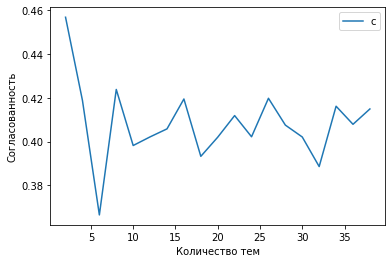

In [ ]:
limit=40; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel('Количество тем')
plt.ylabel('Согласованность')
plt.legend(('coherence_values'), loc='best')
plt.show()

# Визуализация - Доля обращений в распределении по районам

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
No handles with labels found to put in legend.


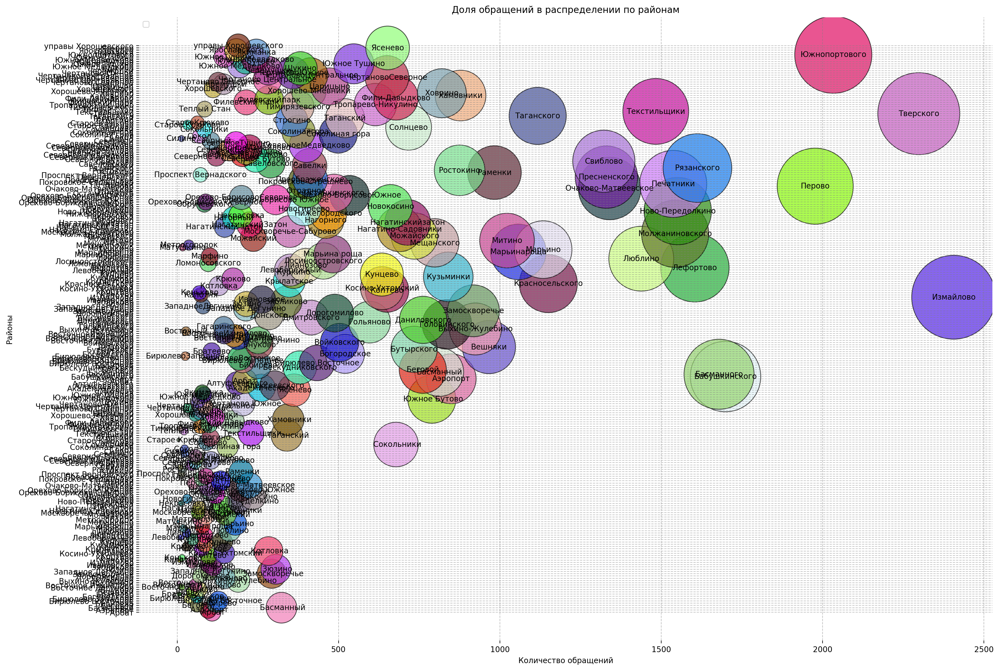

In [ ]:
district_val=pd.DataFrame(test_df['район'].value_counts()).reset_index()
district_val.columns=['district','count']
district_val=district_val.sort_values(by='district',ascending=True).reset_index()
del district_val['index']

group = list(district_val['district'])

data = []
for i in group:
    data.append(district_val[district_val['district']==i])

color=[]
for i in range(1,len(district_val['district'].unique())+1):
    r = lambda: random.randint(0,255)
    color.append('#%02X%02X%02X' % (r(),r(),r()))

fig = plt.figure(figsize=(20,15), dpi=200)
ax = fig.add_subplot(1,1,1)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

ax.xaxis.grid(b=False, which='major', color='gray', linestyle='--', alpha=0.5)
ax.yaxis.grid(b=False, which='major', color='gray', linestyle='--', alpha=0.5)

x=district_val['count']
y=district_val['district']
s=district_val['count']*5
ax.scatter(x, y, alpha=0.7, c=color, edgecolors='k',s=s)

for i, txt in enumerate(district_val['district']):
    ax.annotate(txt, (list(x)[i], list(y)[i]), 
                fontsize=10,
                horizontalalignment='center',
                verticalalignment='center')
        
plt.title("Доля обращений в распределении по районам")
plt.xlabel("Количество обращений")
plt.ylabel("Районы")
plt.legend(loc=2)
plt.show()

# Визуализация - Доля обращений в зависимости от темы/года обращения

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
No handles with labels found to put in legend.


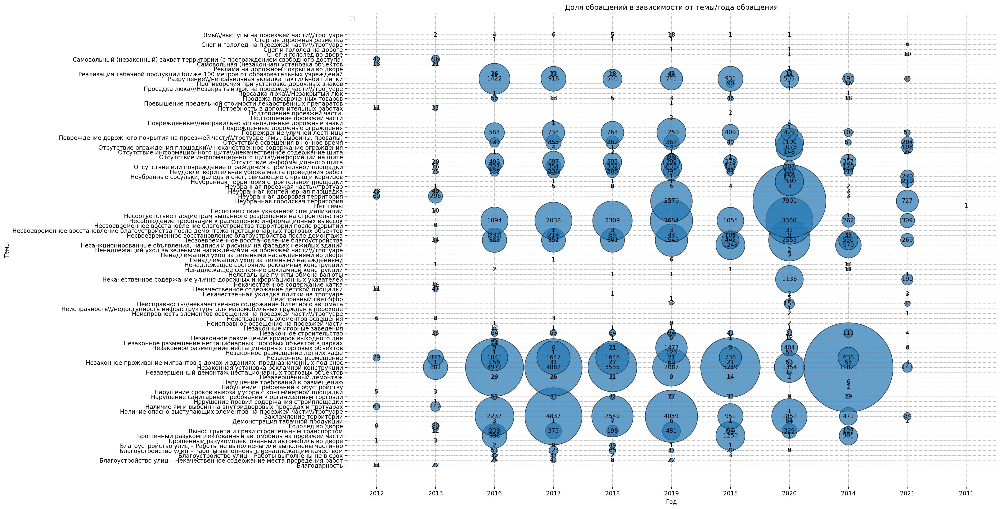

In [ ]:
proba = test_df.groupby(['тема', 'год']).size().reset_index(name='counter')
group = list(proba['тема'])

data = []
for i in group:
    data.append(proba[proba['тема']==i])

color=[]
for i in range(1,len(proba['тема'].unique())+1):
    r = lambda: random.randint(0,255)
    color.append('#%02X%02X%02X' % (r(),r(),r()))

fig = plt.figure(figsize=(20,15), dpi=200)
ax = fig.add_subplot(1,1,1)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

ax.xaxis.grid(b=False, which='major', color='gray', linestyle='-.', alpha=0.5)
ax.yaxis.grid(b=False, which='major', color='gray', linestyle='-.', alpha=0.5)

x=proba['год']
y=proba['тема']
s=proba['counter']*2
ax.scatter(x, y, alpha=0.7, edgecolors='k',s=s)

for i, txt in enumerate(proba['counter']):
    ax.annotate(txt, (list(x)[i], list(y)[i]), 
                fontsize=10,
                horizontalalignment='center',
                verticalalignment='center')
        
plt.title("Доля обращений в зависимости от темы/года обращения")
plt.xlabel("Год")
plt.ylabel("Темы")
plt.legend(loc=2)
plt.show()

In [ ]:
yd=test_df.groupby(['год', 'район']).size().reset_index(name='counter')
dtema=test_df.groupby(['год', 'тема']).size().reset_index(name='counter')

Отфильтруем года, на которые приходится менее 50 районов (полагая, что она не покажут большую значимость на графе)

In [ ]:
yd = yd.loc[yd['counter'] > 50]

# Граф распределения районов по годам

Районы выделены красными узлами; Год, на который приходится обращение района выделены синими узлами

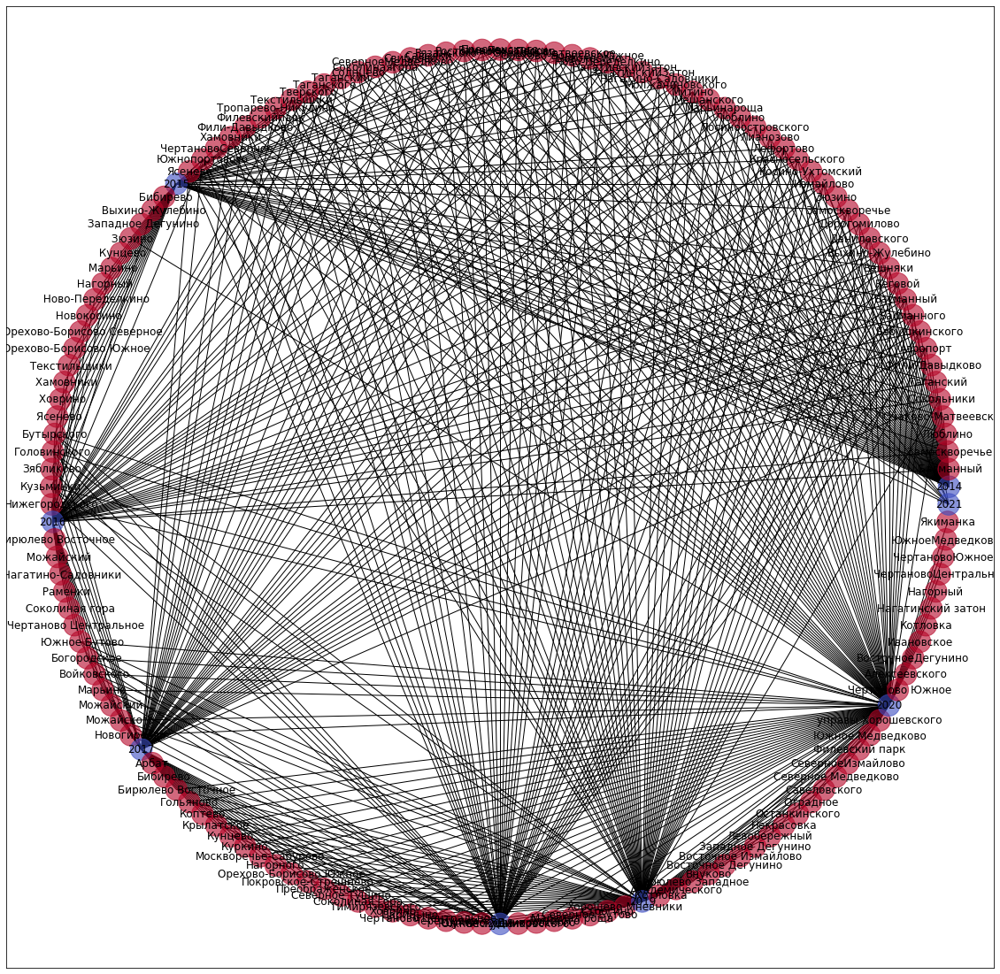

In [ ]:
G = nx.DiGraph()
for i in range(0,len(yd)):
  G.add_edges_from([(yd.iloc[i,0],yd.iloc[i,1])])

val_map = {}
for i in range(0,len(yd)):
  val_map.update({str(yd.iloc[i,0]): 0.0})
values = [val_map.get(node, 0.15) for node in G.nodes()]

pos = nx.circular_layout(G)
cmap = plt.cm.coolwarm
plt.figure(figsize=(20,20))
nx.draw_networkx_nodes(G, pos,
                cmap=cmap, node_color = values,
                node_size = 600,alpha=0.6)
nx.draw_networkx_labels(G, pos)
nx.draw_networkx_edges(G, pos, arrows=False)
plt.show()

# Граф распределения тематик обращений по годам

Тематики выделены красными узлами; Год, на который приходится обращение выделены синими узлами

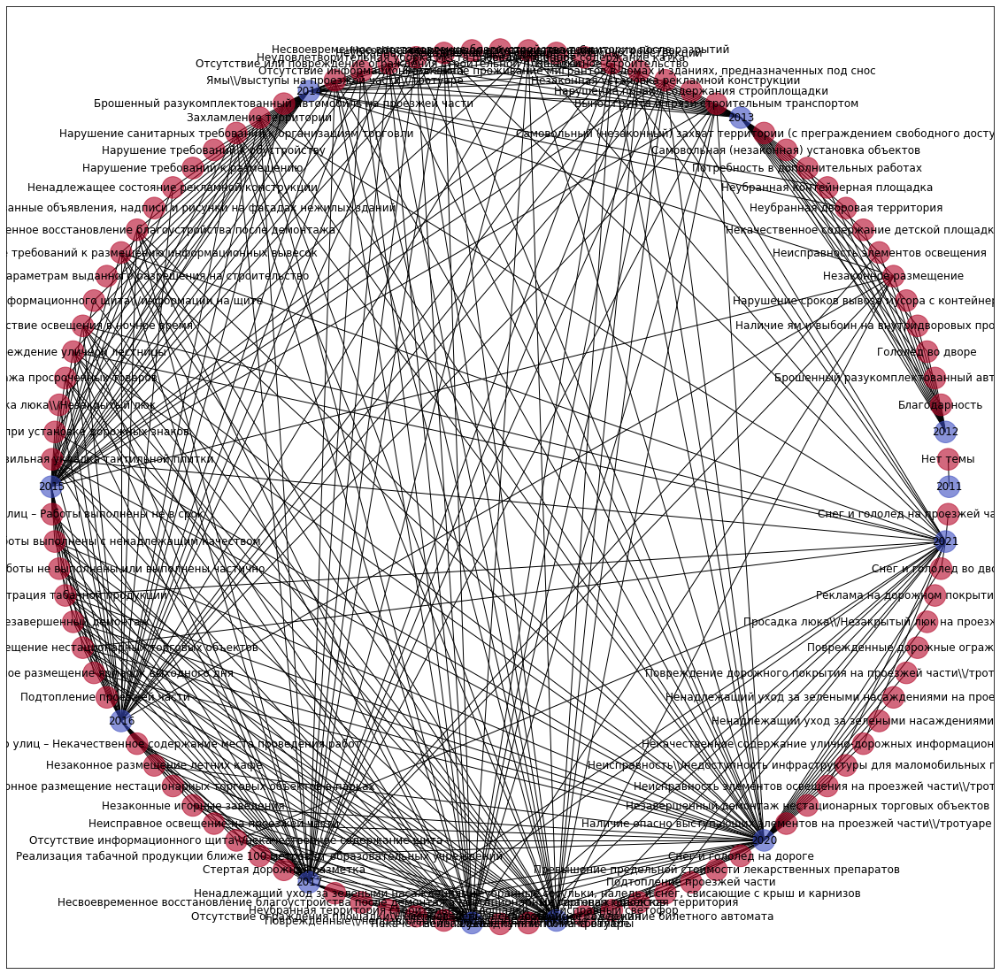

In [ ]:
G = nx.DiGraph()
for ii in range(0,len(dtema)):
  G.add_edges_from([(dtema.iloc[ii,0],dtema.iloc[ii,1])])

val_map = {}
for i in range(0,len(dtema)):
  val_map.update({str(dtema.iloc[i,0]): 0.0})
values = [val_map.get(node, 0.15) for node in G.nodes()]

pos = nx.circular_layout(G)
cmap = plt.cm.coolwarm
plt.figure(figsize=(20,20))
nx.draw_networkx_nodes(G, pos,
                cmap=cmap, node_color = values,
                node_size = 600,alpha=0.6)
nx.draw_networkx_labels(G, pos)
nx.draw_networkx_edges(G, pos, arrows=False)
plt.show()